# What exactly helps, and what exactly blocks, a wheelchair user in this frame?

Two models, one job each:

1. **Gemini** looks at the frame and *names* what matters: a cone, a parked car, a
   scaffold, or on the other side of the ledger a blue accessibility symbol on a door.
   It knows what those things are and why they matter, and puts a rough box around
   each one. It is not precise about edges.
2. **SAM 2.1** takes each of those boxes and turns it into a pixel-exact mask. It is
   extremely precise about edges and has no idea what it is looking at.

Chaining them gives both halves: named things with exact outlines.

The notebook runs that chain twice over, because accessibility is not only about
obstacles. **Section 1-5** find what is *in the way*. **Section 6** finds what *helps* --
the signage, actuators, ramps and handrails that tell a wheelchair user a place is
usable. Both passes share one drawing and export path.

---

**Run this with the `navigability` environment.** From a terminal:

```bash
conda run -n navigability python -m ipykernel install --user --name navigability \
        --display-name "Python (navigability)"
jupyter lab segment_barriers.ipynb     # then Kernel > Change Kernel > navigability
```

The Gemini key is read from `$GEMINI_API_KEY`, or from `.gemini_key` in the project
root -- the same convention `analyze_accessibility.py` uses. SAM 2.1 weights
(~900 MB) download from Hugging Face on first run and are cached in `~/.cache/huggingface`.

In [1]:
from pathlib import Path

PROJECT = Path("/home/yuanhong/Desktop/unmapped_data")

# The frame the obstacle pass runs on, and the frame the feature pass runs on. Any
# colour jpg under filtered/ works -- see the last cell for running over a directory.
IMAGE = PROJECT / "filtered/20260920_053537/color/color_001182.jpg"
FEATURE_IMAGE = PROJECT / "filtered/20260920_041230/color/color_000197.jpg"

OUT_DIR = PROJECT / "segmentation_out"

# Models are tried in order, and the first one that answers is used. The free tier caps
# requests per model PER DAY -- and that day rolls over on Pacific time, not yours -- so
# a single model is not enough to get through a run of frames. When one reports its
# daily cap the notebook moves to the next and says so. Put your preferred model first;
# gemini-3.6-flash is what analyze_accessibility.py uses.
VLM_MODELS = [
    "gemini-3.6-flash",
    "gemini-3.5-flash",
    "gemini-3-flash-preview",
    "gemini-3.1-flash-lite",
]
SAM_MODEL = "facebook/sam2.1-hiera-large"

API_KEY_FILE = PROJECT / ".gemini_key"

# Detections the model is less sure of than this are dropped. "low" keeps everything.
MIN_CONFIDENCE = "low"

# The travel corridor: a crude 2D stand-in for "in the robot's way", used to sort
# barriers by how much they actually block it. Because the camera sits at knee height,
# the ground ahead is compressed into a band across the MIDDLE of the frame -- the
# bottom of the frame is the pavement under the robot's own nose, not the route. This
# box covers that band. Lower y1 to count only what is far ahead.
CORRIDOR = dict(x0=0.20, x1=0.80, y0=0.25, y1=0.70)

OUT_DIR.mkdir(exist_ok=True)
print("obstacles in :", IMAGE.relative_to(PROJECT))
print("features in  :", FEATURE_IMAGE.relative_to(PROJECT))

obstacles in : filtered/20260920_053537/color/color_001182.jpg
features in  : filtered/20260920_041230/color/color_000197.jpg


python      3.12.14
torch       2.14.0+cu130 on cuda (NVIDIA GeForce RTX 5080)
image       1280x720


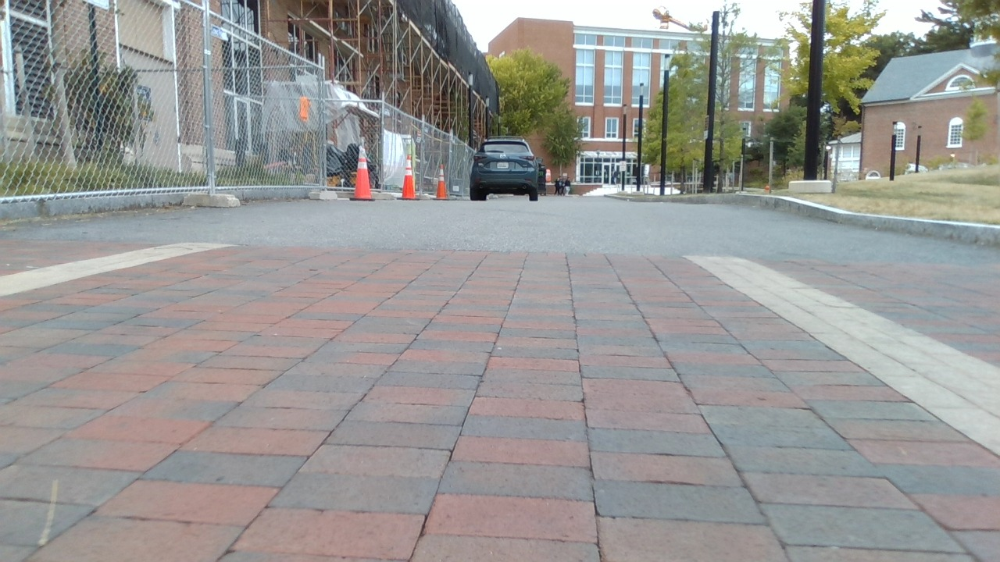

In [2]:
import hashlib
import json
import os
import re
import sys
import textwrap
import time
from dataclasses import dataclass, field
from enum import Enum

try:
    import numpy as np
    import torch
    import matplotlib.pyplot as plt
    from matplotlib import patheffects
    from matplotlib.colors import to_rgb
    from PIL import Image
    from google import genai
    from google.genai import types
    from pydantic import BaseModel, Field
    from scipy import ndimage
    from transformers import Sam2Model, Sam2Processor
except ImportError as exc:
    raise SystemExit(textwrap.dedent(f"""\
        Missing dependency: {exc.name}

        This notebook expects the 'navigability' environment. To build it:

            conda create -n navigability python=3.12 -y
            conda run -n navigability pip install google-genai pillow numpy
            conda run -n navigability pip install torch torchvision
            conda run -n navigability pip install transformers matplotlib scipy ipykernel accelerate

        Then register it as a kernel and pick it from Kernel > Change Kernel:

            conda run -n navigability python -m ipykernel install --user \\
                    --name navigability --display-name "Python (navigability)"
        """)) from exc

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"python      {sys.version.split()[0]}")
print(f"torch       {torch.__version__} on {DEVICE}"
      + (f" ({torch.cuda.get_device_name(0)})" if DEVICE == "cuda" else ""))

image = Image.open(IMAGE).convert("RGB")
W, H = image.size
print(f"image       {W}x{H}")
image

## 1. Ask the VLM what is in the way

The schema below is deliberately closed: the model picks from a fixed vocabulary of
barrier classes rather than inventing labels, so the output of many frames can be
grouped and counted without string cleaning. It mirrors the enums in
`analyze_accessibility.py`, but every entry here also carries a **box**, which is what
makes it a localisation task rather than a scoring one.

In [3]:
class BarrierClass(str, Enum):
    traffic_cone = "traffic_cone"
    construction_fence = "construction_fence"
    scaffolding = "scaffolding"
    barrier_or_jersey_wall = "barrier_or_jersey_wall"
    caution_tape = "caution_tape"
    excavation_or_trench = "excavation_or_trench"
    materials_stockpile = "materials_stockpile"
    heavy_equipment = "heavy_equipment"
    parked_vehicle = "parked_vehicle"
    moving_vehicle = "moving_vehicle"
    bicycle_or_scooter = "bicycle_or_scooter"
    bollard_or_post = "bollard_or_post"
    pole_or_signpost = "pole_or_signpost"
    signage = "signage"
    bin_or_street_furniture = "bin_or_street_furniture"
    planter_or_vegetation = "planter_or_vegetation"
    step_or_curb = "step_or_curb"
    stair_flight = "stair_flight"
    drop_off_edge = "drop_off_edge"
    gap_or_grate = "gap_or_grate"
    pothole_or_broken_pavement = "pothole_or_broken_pavement"
    loose_brick_or_rubble = "loose_brick_or_rubble"
    rough_surface_patch = "rough_surface_patch"
    standing_water = "standing_water"
    cable_or_hose = "cable_or_hose"
    low_clearance_or_overhang = "low_clearance_or_overhang"
    door_or_gate = "door_or_gate"
    person_or_crowd = "person_or_crowd"
    other = "other"


class Severity(str, Enum):
    low = "low"
    medium = "medium"
    high = "high"


class Relation(str, Enum):
    on_path = "on_path"
    narrows_path = "narrows_path"
    beside_path = "beside_path"


class Confidence(str, Enum):
    low = "low"
    medium = "medium"
    high = "high"


class Barrier(BaseModel):
    label: str = Field(
        description="Three or four words naming this specific object, e.g. 'orange traffic cone'.")
    kind: BarrierClass
    box_2d: list[int] = Field(
        description="Exactly four integers [ymin, xmin, ymax, xmax], each 0-1000 "
                    "normalised to the image, y measured down from the top edge. "
                    "Tight around the visible extent of this one object.")
    severity: Severity
    relation: Relation
    reason: str = Field(
        description="Under 15 words: what this does to a wheelchair user specifically.")
    confidence: Confidence


class Detections(BaseModel):
    barriers: list[Barrier]
    scene_note: str = Field(description="One sentence, under 25 words, on the scene as a whole.")

In [4]:
BARRIER_PROMPT = """\
You locate the things in a photograph that would stop or hinder a wheelchair user. The \
photograph comes from a camera mounted on a quadruped robot teleoperated around a \
university campus.

THE VIEWPOINT IS UNUSUAL -- read this before judging anything:
- The camera sits about 0.35 m above the ground, roughly at an adult's knee height, \
facing forward and tilted slightly down. It is not an eye-level photograph.
- Because the view is so low, the ground fills much of the frame and is seen at a very \
shallow angle. Distance compresses sharply with range: a band of surface that looks \
thin near the top of the frame can be many metres long.
- People and vehicles are seen from below and are often cropped at the waist or wheels. \
Parts of the robot itself may intrude at the bottom edge -- never report the robot's \
own body as an obstacle.
- Frames are 1280x720 and some carry motion blur, blown-out sky or deep shadow.

WHAT TO RETURN:
One entry per distinct physical thing a wheelchair user would have to go around, squeeze \
past, climb over, or be endangered by. Box each instance separately -- three traffic \
cones are three entries, not one. A continuous run of one structure is a single entry \
covering the whole run: one length of fencing, one scaffold, one flight of stairs.
Include construction structures such as scaffolding and temporary fencing even when \
they stand beside the route rather than on it, because their legs, base plates, anchor \
blocks and debris netting reach the ground and take width away.
Construction sites stack several different structures in the same part of the frame, \
and each one is its own entry. A scaffold standing against a building behind a run of \
temporary fencing is TWO entries -- the scaffold and the fence -- not one. Look past \
whatever is nearest the camera and name each structure you can see behind it: scaffold \
decks, poles and diagonal bracing, debris netting or shrink wrap, chain-link fence \
panels and the concrete blocks weighing them down.
Do not box the open ground that is clear to travel over. Only box what is in the way.
Judge the route the robot is travelling along, and ignore surfaces plainly separated \
from it. A lawn, a planting bed or a field beside a path is scenery, not an obstacle, \
and must not be reported as one; the edge where the path meets it can be, if there is \
a lip or a drop there. Report a soft surface only where the route itself crosses it.

BOX FORMAT:
box_2d is [ymin, xmin, ymax, xmax] -- four integers from 0 to 1000, normalised to the \
image, with y measured downward from the top edge. Make each box tight around the \
visible extent of that one object, and include only what is actually inside the frame.
Getting the box tight matters more than usual: each box is handed to a segmentation \
model that will trace the object's exact outline inside it, so a box that is too \
generous drags in the background around the object.

HOW TO JUDGE SEVERITY:
Severity is the effect on a wheelchair user specifically, not on the robot and not on \
an able-bodied walker. low = noticeable but passable. medium = requires care, slows \
them down or forces a detour. high = likely to stop them, tip them, or put them in the \
path of traffic.

HOW TO JUDGE RELATION:
on_path = it stands on the walkable surface ahead; a wheelchair would have to go around \
it or stop. narrows_path = it stands at the edge of that surface and takes usable width \
away. beside_path = it is off the route, behind a kerb, fence or verge, but still worth \
recording, such as a roadway where vehicles move or a structure overhead.

SOME FRAMES ARE SHOT AT NIGHT:
They are dark, heavily speckled with sensor noise, and lit only by street lights and \
windows. Wet ground is common in them, and wet is not the same as flooded. Tell \
standing water from merely damp pavement by what it does to light: a puddle mirrors \
the lamps, windows and sky above it, it has a sharp edge where that reflection stops, \
and it reads flatter and darker than the textured surface around it. Report \
standing_water only where you can see that mirroring, and box the pooled area rather \
than the whole wet surface. Damp pavement with nothing pooled on it is a surface \
condition, not an obstacle, and belongs in no list.
Darkness is not a reason to guess. If the frame is too dark to tell what something is, \
leave it out.

PAVING THAT HAS COME APART:
Loose bricks, pavers or chunks of concrete that have lifted out of a surface and are \
lying beside it are loose_brick_or_rubble, whether they sit on the path, on the verge \
or in the grass at its edge. Report the gap they left behind separately as \
pothole_or_broken_pavement when you can see it. Both matter: the hole catches a \
castor, and the loose pieces roll under one.

DO NOT JUDGE GROUND SLOPE OR GRADIENT. The robot measures it with its IMU, far more \
accurately than a photograph allows. Do report discrete vertical features -- steps, \
kerbs, lips, gaps, root heave -- because those are what the IMU cannot see.

ACCURACY OVER COMPLETENESS:
A confident wrong answer is far worse than a short list. Report only what is visible in \
this frame; do not infer from what a campus usually has, and do not pad the list with \
things you suspect but cannot see. If nothing is in the way, return an empty list."""

print(f"[BARRIER_PROMPT: {len(BARRIER_PROMPT)} characters]")

[BARRIER_PROMPT: 5254 characters]


In [5]:
CACHE_DIR = OUT_DIR / ".vlm_cache"
CACHE_DIR.mkdir(exist_ok=True)


def gemini_client(key_file: Path = API_KEY_FILE) -> genai.Client:
    """Build a Gemini client from $GEMINI_API_KEY, or from the project key file."""
    key = next((os.environ[v].strip() for v in ("GEMINI_API_KEY", "GOOGLE_API_KEY")
                if os.environ.get(v, "").strip()), None)
    if not key and key_file.exists():
        key = key_file.read_text().strip()
    if not key:
        raise SystemExit(textwrap.dedent(f"""\
            No Gemini key found. Either:
                export GEMINI_API_KEY='your-key'
            or write it to the file this notebook reads automatically:
                printf '%s' 'your-key' > {key_file}
                chmod 600 {key_file}
            Keys come from https://aistudio.google.com/apikey"""))
    return genai.Client(api_key=key)


def _cache_path(image_path: Path, prompt: str, schema: type, question: str) -> Path:
    """One cache file per (image, prompt, schema, question).

    The model is deliberately NOT part of the key. On a free-tier key the run falls back
    between models whenever one hits its daily cap, and keying on the model would throw
    away every earlier answer each time that happened. Which model actually replied is
    recorded inside the file instead, so a mixed-model run stays traceable. Editing a
    prompt or a schema still re-asks, which is the invalidation that matters.
    """
    h = hashlib.sha256()
    h.update(image_path.read_bytes())
    h.update(prompt.encode())
    h.update(json.dumps(schema.model_json_schema(), sort_keys=True).encode())
    h.update(question.encode())
    return CACHE_DIR / f"{image_path.stem}_{h.hexdigest()[:16]}.json"


def _retry_delay(exc, default=20.0) -> float:
    """Seconds the server asked us to wait, from the RetryInfo it attaches to a 429."""
    m = re.search(r"'retryDelay':\s*'(\d+(?:\.\d+)?)s'", str(exc))
    return float(m.group(1)) + 1.0 if m else default


class DailyCapReached(Exception):
    """This model is done for the day; another one may still have budget."""


# Models that reported their daily cap in this session, so we stop asking them, and a
# record of which model actually answered for each image.
CAPPED: set = set()
MODEL_USED: dict = {}


def _one_call(client, image_path, prompt, schema, question, model, attempts=6):
    """One model, with backoff for rate limits and for the model simply being busy."""
    for attempt in range(attempts):
        try:
            resp = client.models.generate_content(
                model=model,
                contents=[types.Part.from_bytes(data=image_path.read_bytes(),
                                                mime_type="image/jpeg"),
                          question],
                config=types.GenerateContentConfig(
                    system_instruction=prompt,
                    response_mime_type="application/json",
                    response_schema=schema,
                    # Signs and cones are small and far away; do not let the image be
                    # downsampled before the model sees it.
                    media_resolution=types.MediaResolution.MEDIA_RESOLUTION_HIGH,
                    temperature=0.0,
                ),
            )
            return resp.parsed
        except genai.errors.ClientError as exc:
            # 429 is the only client error worth retrying: anything else is our fault
            # and will fail again identically.
            if getattr(exc, "code", None) != 429:
                raise
            if "PerDay" in str(exc):
                raise DailyCapReached(model) from exc
            if attempt == attempts - 1:
                raise
            wait = _retry_delay(exc)
            print(f"  {model} rate limited, waiting {wait:.0f}s "
                  f"(attempt {attempt + 1}/{attempts}) ...")
            time.sleep(wait)
        except genai.errors.ServerError as exc:
            # 5xx means the model is busy, not that the request is wrong. Capped rather
            # than unbounded backoff: a spike clears in a minute or two, and a run over
            # many frames should ride it out rather than die on frame three.
            if attempt == attempts - 1:
                raise
            wait = min(60.0, 5.0 * 2 ** attempt)
            print(f"  {model} is busy ({getattr(exc, 'code', '5xx')}), waiting "
                  f"{wait:.0f}s (attempt {attempt + 1}/{attempts}) ...")
            time.sleep(wait)


def ask(image_path: Path, prompt: str, schema: type, question: str,
        models=None, refresh: bool = False):
    """One VLM answer about one image, as an instance of `schema`.

    Answers are cached on disk, so re-running the notebook is free and a stopped run
    over many frames picks up where it left off. Pass refresh=True to ask again. Both
    passes -- obstacles and features -- come through here; only the prompt, the schema
    and the question differ.
    """
    cached = _cache_path(image_path, prompt, schema, question)
    if cached.exists() and not refresh:
        blob = json.loads(cached.read_text())
        MODEL_USED.setdefault(image_path.name, set()).add(blob.get("model", "?"))
        print(f"cached   {cached.name}  ({blob.get('model', '?')})")
        return schema.model_validate(blob["data"])

    client = gemini_client()
    candidates = [m for m in (models or VLM_MODELS) if m not in CAPPED]
    if not candidates:
        raise SystemExit(
            "Every model in VLM_MODELS has hit its free-tier daily cap.\n"
            "The cap rolls over on Pacific time. Add another model to VLM_MODELS in the\n"
            "config cell, or come back later -- cached frames will not be re-asked.")

    for model in candidates:
        try:
            parsed = _one_call(client, image_path, prompt, schema, question, model)
            break
        except DailyCapReached:
            CAPPED.add(model)
            print(f"  {model} has used up its free-tier quota for today, trying the next")
    else:
        raise SystemExit(
            f"All of {', '.join(candidates)} hit their free-tier daily cap.\n"
            f"The cap rolls over on Pacific time. Add another model to VLM_MODELS in\n"
            f"the config cell, or come back later -- cached frames are not re-asked.")

    cached.write_text(json.dumps(
        {"model": model, "data": json.loads(parsed.model_dump_json())}, indent=2))
    MODEL_USED.setdefault(image_path.name, set()).add(model)
    print(f"asked    {model}")
    return parsed


# A hint is what the person who recorded the frame already knows is in it. At night, or
# in a blown-out window, the model can miss something a human saw plainly, and telling
# it where to look is cheaper and more honest than pretending the model found it alone.
# The hint is part of the cache key and is written into the exported json, so an
# annotation produced with help is never mistaken for one produced without it. The
# closing sentence matters: without it a hint turns into a demand, and the model will
# invent a box to satisfy it.
HINTED = (" The person who recorded this frame notes: {hint}"
          " Find and box that, along with anything else that qualifies."
          " If you cannot actually see what they describe, say nothing about it rather"
          " than guessing at where it might be.")


def detect_barriers(image_path: Path, hint: str = "", **kw) -> Detections:
    q = "Find every barrier to a wheelchair user in this frame and box each one."
    return ask(image_path, BARRIER_PROMPT, Detections,
               q + HINTED.format(hint=hint) if hint else q, **kw)


result = detect_barriers(IMAGE)
print(result.scene_note, "\n")
print(f"{len(result.barriers)} barriers found")

cached   color_001182_44d67a7afd8e2695.json  (gemini-3.5-flash)
The path transitions from brick to asphalt, bordered by construction fencing on the left and a curb on the right, with a parked vehicle blocking the way ahead. 

7 barriers found


## 2. Boxes into pixels

Gemini returns boxes as `[ymin, xmin, ymax, xmax]` normalised to 0-1000 with y running
down from the top. SAM wants `[x0, y0, x1, y1]` in pixels. That conversion is the one
place where a silent mistake would put every mask in the wrong spot, so it is a
function of its own with the axis order written out.

Both passes then collapse into one `Annotation` record. Keeping a single record type
is what lets one drawing function and one exporter serve obstacles and features alike,
instead of two near-copies drifting apart.

In [6]:
CONF_ORDER = {"low": 0, "medium": 1, "high": 2}


@dataclass
class Annotation:
    """One thing to outline on the image, from either pass."""
    label: str
    kind: str
    box: list          # x0, y0, x1, y1, in pixels
    tone: str          # which PALETTE entry paints it
    rating: str        # the word shown in the RATING column: a severity, or a state
    note: str          # what it means for a wheelchair user
    confidence: str
    relation: str = ""
    text: str = ""     # words printed on it, for signage


def to_pixels(box_2d, width: int, height: int):
    """[ymin, xmin, ymax, xmax] in 0-1000 -> [x0, y0, x1, y1] in pixels."""
    ymin, xmin, ymax, xmax = box_2d
    x0, x1 = sorted((xmin / 1000 * width, xmax / 1000 * width))
    y0, y1 = sorted((ymin / 1000 * height, ymax / 1000 * height))
    return [max(0.0, x0), max(0.0, y0), min(float(width), x1), min(float(height), y1)]


def to_annotations(items, width, height, make, min_conf=MIN_CONFIDENCE):
    """Drop malformed, degenerate and low-confidence boxes; build Annotations from the rest.

    `make` turns one parsed model object plus its pixel box into an Annotation, and is
    the only thing that differs between the obstacle pass and the feature pass.
    """
    kept, dropped = [], []
    for it in items:
        if len(it.box_2d) != 4:
            dropped.append((it, "box_2d is not four numbers"))
            continue
        if CONF_ORDER[it.confidence] < CONF_ORDER[min_conf]:
            dropped.append((it, f"confidence {it.confidence.value} below {min_conf}"))
            continue
        box = to_pixels(it.box_2d, width, height)
        if box[2] - box[0] < 2 or box[3] - box[1] < 2:
            dropped.append((it, "box is empty after clipping to the frame"))
            continue
        kept.append(make(it, box))
    return kept, dropped


def barrier_annotation(b, box) -> Annotation:
    return Annotation(label=b.label, kind=b.kind.value, box=box, tone=b.severity.value,
                      rating=b.severity.value, note=b.reason,
                      confidence=b.confidence.value, relation=b.relation.value)


def show_table(annotations, dropped=()):
    rows = [(f"{i:>2}", a.kind, a.rating, a.relation,
             f"{a.box[2] - a.box[0]:.0f}x{a.box[3] - a.box[1]:.0f}", a.label)
            for i, a in enumerate(annotations, 1)]
    widths = [max(len(r[c]) for r in rows) for c in range(6)] if rows else []
    for r in rows:
        print("  ".join(v.ljust(w) for v, w in zip(r, widths)))
    for it, why in dropped:
        print(f"  dropped  {it.label}: {why}")


barriers, rejected = to_annotations(result.barriers, W, H, barrier_annotation)
show_table(barriers, rejected)

 1  construction_fence  medium  narrows_path  612x277  construction chain link fence
 2  scaffolding         low     beside_path   310x188  construction scaffolding     
 3  traffic_cone        low     narrows_path  36x73    orange traffic cone          
 4  traffic_cone        low     narrows_path  26x63    orange traffic cone          
 5  traffic_cone        low     narrows_path  19x45    orange traffic cone          
 6  parked_vehicle      high    on_path       93x84    parked SUV                   
 7  step_or_curb        medium  narrows_path  307x74   concrete curb                


## 3. Boxes into masks

SAM 2.1 is prompted with the boxes rather than run in "segment everything" mode. Box
prompting is what keeps the masks tied to things the VLM actually named -- everything
mode would also happily hand back the sky, each individual paver and the side of the
building.

In [7]:
processor = Sam2Processor.from_pretrained(SAM_MODEL)
sam = Sam2Model.from_pretrained(SAM_MODEL).to(DEVICE).eval()
print(f"{SAM_MODEL} loaded on {DEVICE}")

[transformers] You are using a model of type `sam2_video` to instantiate a model of type `sam2`. This may be expected if you are loading a checkpoint that shares a subset of the architecture (e.g., loading a `sam2_video` checkpoint into `Sam2Model`), but is otherwise not supported and can yield errors. Please verify that the checkpoint is compatible with the model you are instantiating.


Loading weights:   0%|          | 0/741 [00:00<?, ?it/s]

facebook/sam2.1-hiera-large loaded on cuda


In [8]:
def despeckle(mask, floor=90, share=0.004):
    """Drop islands too small to mean anything, keeping the mask's real shape.

    A puddle at night is a field of separate bright reflections, and SAM returns every
    one of them. Hundreds of three-pixel islands add nothing an outline can show and
    turn the drawing into confetti, so a component is kept only if it clears both an
    absolute floor and a share of the mask it belongs to. Genuinely fragmented masks --
    the mesh of a chain-link fence, a scaffold seen through it -- keep their large
    pieces, because the share test is relative to the mask's own size.
    """
    labelled, n = ndimage.label(mask)
    if n <= 1:
        return mask
    sizes = ndimage.sum_labels(mask, labelled, index=np.arange(1, n + 1))
    keep = sizes >= max(floor, share * mask.sum())
    if not keep.any():                      # everything is small: keep the largest
        keep[sizes.argmax()] = True
    return np.isin(labelled, np.flatnonzero(keep) + 1)


def segment(image: Image.Image, annotations, clean=True) -> np.ndarray:
    """One mask per annotation box. Returns a boolean array (n, height, width)."""
    if not annotations:
        return np.zeros((0, image.size[1], image.size[0]), dtype=bool)
    boxes = [a.box for a in annotations]
    inputs = processor(images=image, input_boxes=[boxes], return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        out = sam(**inputs, multimask_output=False)
    masks = processor.post_process_masks(out.pred_masks, inputs["original_sizes"])[0]
    masks = masks.squeeze(1).bool().cpu().numpy()
    return np.stack([despeckle(m) if m.any() else m for m in masks]) if clean else masks


masks = segment(image, barriers)
print(f"{masks.shape[0]} masks at {masks.shape[2]}x{masks.shape[1]}")
for a, m in zip(barriers, masks):
    print(f"  {a.label:<34} {m.sum() / m.size * 100:5.2f}% of the frame")

7 masks at 1280x720
  construction chain link fence      14.11% of the frame
  construction scaffolding            3.78% of the frame
  orange traffic cone                 0.13% of the frame
  orange traffic cone                 0.08% of the frame
  orange traffic cone                 0.05% of the frame
  parked SUV                          0.66% of the frame
  concrete curb                       0.71% of the frame


## 4. Draw it

Colour carries one thing: how severe an obstacle is, or that something is a feature
rather than an obstacle. The four steps clear the colour-vision-deficiency and
normal-vision separation thresholds against these frames' mean tone, checked all-pairs
rather than by eye -- plain green failed that check against the red, which is why
features are aqua.

Because any saturated colour sits below 3:1 contrast against a photograph, colour is
never asked to carry meaning alone: every mask gets a white under-ring so its edge is
visible whatever lies beneath it, a numbered badge, and a row in the key underneath.

wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_001182_barriers.png


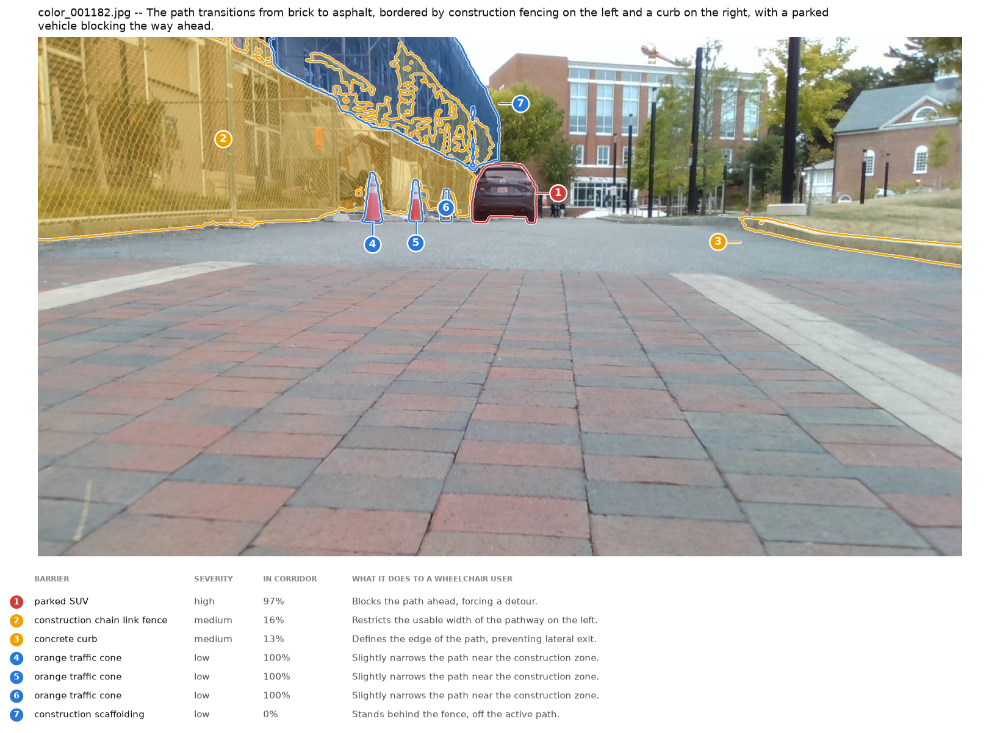

In [9]:
PALETTE = {
    "high": "#d03b3b",      # obstacle: likely to stop them, tip them, or endanger them
    "medium": "#eda100",    # obstacle: requires care, slows them, forces a detour
    "low": "#2a78d6",       # obstacle: noticeable but passable
    "feature": "#1baf7a",   # not an obstacle at all -- something that helps
}
SEVERITY_ORDER = {"high": 0, "medium": 1, "low": 2}
FILL_ALPHA = 0.42        # a big region needs a wash to read as one mark
SMALL_FILL_ALPHA = 0.18  # on a small mark the ring already does that job, and a heavy
                         # wash would hide what is printed on the sign underneath it


def clip(text, n):
    """Trim to n characters on a word boundary, so a note never ends mid-word."""
    if len(text) <= n:
        return text
    return (text[:n].rsplit(" ", 1)[0] or text[:n]).rstrip(" ,.;:") + "..."


BADGE_COVER_LIMIT = 0.03   # a badge may hide at most this share of its own mask


def is_small(mask, badge_px):
    """True when the mark cannot carry a badge or a heavy fill without being hidden.

    Two ways to fail. A mark can be too narrow outright -- a door decal is thinner than
    the badge that names it. Or it can be wide enough and still be mostly meaning: a
    130-pixel accessibility sign has room for a badge, but the badge would land on the
    wheelchair symbol, which is the one thing the reader is there to see. Measuring the
    badge against the mask's area catches the second case.
    """
    ys, xs = np.nonzero(mask)
    if min(xs.max() - xs.min(), ys.max() - ys.min()) < 3 * badge_px:
        return True
    return np.pi * (badge_px / 2) ** 2 > BADGE_COVER_LIMIT * mask.sum()


def badge_size(image) -> float:
    """Roughly how many image pixels across a numbered badge renders."""
    return max(14.0, image.size[0] / 55)


def in_corridor(mask) -> float:
    """Fraction of this mask that falls in the strip of frame the robot drives through."""
    h, w = mask.shape
    sl = mask[int(CORRIDOR["y0"] * h):int(CORRIDOR["y1"] * h),
              int(CORRIDOR["x0"] * w):int(CORRIDOR["x1"] * w)]
    return float(sl.sum()) / float(mask.sum()) if mask.sum() else 0.0


# Each column is (header, x position in the key, how to get the value). The obstacle
# pass and the feature pass want different middle columns -- how much of the route a
# thing blocks means nothing for a sign on a door, and what a sign reads means nothing
# for a kerb -- so the column set travels with the call rather than being baked in.
BARRIER_COLUMNS = [
    ("BARRIER", 0.028, lambda a, m: clip(a.label, 38)),
    ("SEVERITY", 0.190, lambda a, m: a.rating),
    ("IN CORRIDOR", 0.260, lambda a, m: f"{in_corridor(m):.0%}"),
    ("WHAT IT DOES TO A WHEELCHAIR USER", 0.350, lambda a, m: clip(a.note, 82)),
]
FEATURE_COLUMNS = [
    ("FEATURE", 0.028, lambda a, m: clip(a.label, 38)),
    ("STATE", 0.190, lambda a, m: a.rating),
    ("READS", 0.255, lambda a, m: f'"{a.text}"' if a.text else ""),
    ("WHAT IT GIVES A WHEELCHAIR USER", 0.520, lambda a, m: clip(a.note, 62)),
]
COMBINED_COLUMNS = [
    ("WHAT", 0.028, lambda a, m: clip(a.label, 34)),
    ("RATING", 0.175, lambda a, m: a.rating),
    ("IN CORRIDOR", 0.240, lambda a, m: f"{in_corridor(m):.0%}"),
    ("READS", 0.320, lambda a, m: f'"{a.text}"' if a.text else ""),
    ("MEANS FOR A WHEELCHAIR USER", 0.570, lambda a, m: clip(a.note, 54)),
]


def badge_spot(mask, others, placed, badge_px):
    """Where to put a mask's number so the number does not hide what it names.

    Three things disqualify a spot: the mask is too small to hold a badge at all, the
    spot sits on some OTHER annotation's mask, or it collides with a badge already
    placed. The middle one is what nested detections need -- an accessibility symbol
    inside the sign that carries it would otherwise be buried under the sign's own
    number. Returns (x, y, anchor-or-None); an anchor means draw a leader line.
    """
    ys, xs = np.nonzero(mask)
    x0, x1, y0, y1 = xs.min(), xs.max(), ys.min(), ys.max()
    h, w = mask.shape

    def free(x, y):
        if not (badge_px <= x <= w - badge_px and badge_px <= y <= h - badge_px):
            return False
        if any(np.hypot(x - px, y - py) < 2.2 * badge_px for px, py in placed):
            return False
        return not any(o[int(round(y)), int(round(x))] for o in others)

    cx, cy = xs.mean(), ys.mean()
    if not is_small(mask, badge_px) and free(cx, cy):
        return cx, cy, None

    gap, mid_y, mid_x = badge_px * 1.3, (y0 + y1) / 2, (x0 + x1) / 2
    for bx, by in ((x1 + gap, mid_y), (x0 - gap, mid_y),
                   (mid_x, y0 - gap), (mid_x, y1 + gap),
                   (x1 + gap * 2.2, mid_y), (x0 - gap * 2.2, mid_y)):
        if free(bx, by):
            # End the leader on the edge of the mask's box, not its middle, so the
            # line stops at the thing rather than being drawn across it.
            return bx, by, (min(max(bx, x0), x1), min(max(by, y0), y1))
    return cx, cy, None


def by_severity(a, m):
    """Worst obstacle first, and within a severity the one most in the way."""
    return (SEVERITY_ORDER.get(a.rating, 9), -in_corridor(m))


def by_reading_order(a, m):
    """Top to bottom, then left to right -- how a stack of signs is actually read."""
    return (round(a.box[1]), round(a.box[0]))


def helps_last(a, m):
    """Obstacles worst-first, then the features, so the key reads as a verdict."""
    return (a.tone == "feature", SEVERITY_ORDER.get(a.rating, 9), -in_corridor(m))


def draw(image, annotations, masks, columns=BARRIER_COLUMNS, rank=by_severity,
         title=None, save_to=None):
    ranked = sorted(range(len(annotations)), key=lambda i: rank(annotations[i], masks[i]))
    n = len(ranked)
    key_h = max(1.1, 0.30 * n + 0.5)
    img_h = 15 * image.size[1] / image.size[0]
    fig, (ax, key) = plt.subplots(2, 1, figsize=(15, img_h + key_h), dpi=110,
                                  gridspec_kw=dict(height_ratios=[img_h, key_h]))

    ax.imshow(image)
    ax.set_axis_off()
    if title:
        ax.set_title(textwrap.fill(title, 150), fontsize=12, loc="left",
                     color="#0b0b0b", pad=8)

    # Biggest mask first, so a long run of fencing never paints over a cone standing in
    # front of it. Badges go on afterwards, above every fill.
    badge_px = badge_size(image)
    badge_of = {i: badge for badge, i in enumerate(ranked, 1)}
    for i in sorted(ranked, key=lambda j: -masks[j].sum()):
        mask = masks[i]
        if not mask.any():
            continue
        color = PALETTE[annotations[i].tone]
        fill = np.zeros((*mask.shape, 4))
        fill[mask] = (*to_rgb(color),
                      SMALL_FILL_ALPHA if is_small(mask, badge_px) else FILL_ALPHA)
        ax.imshow(fill)
        # White first, colour on top: the edge stays visible over dark and light pixels.
        ax.contour(mask.astype(float), levels=[0.5], colors="white", linewidths=3.2, alpha=0.85)
        ax.contour(mask.astype(float), levels=[0.5], colors=[color], linewidths=1.6)

    placed = []
    for i in ranked:
        mask = masks[i]
        if not mask.any():
            continue
        color = PALETTE[annotations[i].tone]
        others = [masks[j] for j in ranked if j != i and masks[j].any()]
        bx, by, anchor = badge_spot(mask, others, placed, badge_px)
        placed.append((bx, by))
        if anchor:
            for lw, c in ((3.0, "white"), (1.4, color)):
                ax.plot([bx, anchor[0]], [by, anchor[1]], color=c, lw=lw,
                        solid_capstyle="round", zorder=9)
        ax.text(bx, by, str(badge_of[i]),
                color="white", fontsize=11, fontweight="bold",
                ha="center", va="center", zorder=10,
                bbox=dict(boxstyle="circle,pad=0.32", facecolor=color,
                          edgecolor="white", linewidth=1.6),
                path_effects=[patheffects.withStroke(linewidth=0.6, foreground=color)])

    # The contrast of a saturated mark against a photograph is always under 3:1, so this
    # key is not decoration -- it is what carries the meaning colour cannot.
    key.set_axis_off()
    key.set_xlim(0, 1)
    key.set_ylim(-(n + 0.6), 0.9)
    for head, x, _ in columns:
        key.text(x, 0.2, head, fontsize=8, color="#898781", fontweight="bold", va="center")
    for row, i in enumerate(ranked, 1):
        a, mask, y = annotations[i], masks[i], -row
        key.text(0.010, y, str(row), fontsize=9, color="white", fontweight="bold",
                 ha="center", va="center",
                 bbox=dict(boxstyle="circle,pad=0.3", facecolor=PALETTE[a.tone],
                           edgecolor="none"))
        for c, (_, x, value) in enumerate(columns):
            key.text(x, y, value(a, mask), fontsize=9.5, va="center",
                     color="#0b0b0b" if c == 0 else "#52514e")

    fig.tight_layout()
    if save_to:
        fig.savefig(save_to, bbox_inches="tight", facecolor="white")
        print("wrote", save_to)
    return fig


fig = draw(image, barriers, masks,
           title=f"{IMAGE.name} -- {result.scene_note}",
           save_to=OUT_DIR / f"{IMAGE.stem}_barriers.png")
plt.show()

## 5. Keep the masks, not just the picture

The overlay is for looking at. What is worth keeping for anything downstream is the
masks themselves and the reasoning attached to each one, so both go out next to the
image: one `.npz` of boolean masks, one `.json` describing them, and a single-channel
label map where pixel value `k` means "annotation number `k` in the json".

In [10]:
def export(image_path, annotations, masks, note, suffix="barriers", hint="",
           out_dir=OUT_DIR):
    stem = f"{image_path.stem}_{suffix}"
    size = Image.open(image_path).size
    label_map = np.zeros(masks.shape[1:], dtype=np.uint8) if len(masks) else None
    records = []
    for i, (a, mask) in enumerate(zip(annotations, masks), 1):
        label_map[mask] = i
        records.append(dict(
            id=i, label=a.label, kind=a.kind, tone=a.tone, rating=a.rating,
            relation=a.relation, text=a.text, confidence=a.confidence, note=a.note,
            box_xyxy=[round(v, 1) for v in a.box],
            mask_pixels=int(mask.sum()),
            frame_fraction=round(float(mask.sum()) / mask.size, 5),
            corridor_fraction=round(in_corridor(mask), 3)))

    payload = dict(image=str(image_path), width=size[0], height=size[1],
                   vlm_models=sorted(MODEL_USED.get(image_path.name, {"?"})),
                   sam_model=SAM_MODEL, note=note, operator_hint=hint,
                   annotations=records)
    (out_dir / f"{stem}.json").write_text(json.dumps(payload, indent=2))
    np.savez_compressed(out_dir / f"{stem}_masks.npz", masks=masks,
                        labels=np.array([a.label for a in annotations]))
    if label_map is not None:
        Image.fromarray(label_map).save(out_dir / f"{stem}_labelmap.png")
    for f in (f"{stem}.json", f"{stem}_masks.npz", f"{stem}_labelmap.png"):
        print("wrote", out_dir / f)
    return payload


payload = export(IMAGE, barriers, masks, result.scene_note)

wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_001182_barriers.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_001182_barriers_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_001182_barriers_labelmap.png


## 6. The other half: what helps

Everything so far answers "what is in the way". A dataset that only records obstacles
describes a campus as uniformly hostile, which is not what the frames show. The same
chain run against a second, opposite prompt finds the things that tell a wheelchair
user a place *is* usable: the International Symbol of Accessibility, door actuators
and the signs pointing at them, ramps, handrails, lifts, tactile paving.

The demo frame is a glass door photographed from inside. Two round decals sit on the
glass, one above the other. Only one of them is an accessibility feature.

In [11]:
class FeatureClass(str, Enum):
    accessibility_symbol = "accessibility_symbol"
    door_actuator_button = "door_actuator_button"
    automatic_door_sign = "automatic_door_sign"
    accessible_route_sign = "accessible_route_sign"
    ramp = "ramp"
    curb_ramp = "curb_ramp"
    level_threshold = "level_threshold"
    handrail = "handrail"
    grab_bar = "grab_bar"
    elevator_or_lift = "elevator_or_lift"
    elevator_call_button = "elevator_call_button"
    braille_or_tactile_sign = "braille_or_tactile_sign"
    tactile_paving = "tactile_paving"
    accessible_parking_space = "accessible_parking_space"
    crossing_push_button = "crossing_push_button"
    rest_seating = "rest_seating"
    other = "other"


class FeatureState(str, Enum):
    usable = "usable"
    obstructed = "obstructed"
    unclear = "unclear"


class Feature(BaseModel):
    label: str = Field(description="Three or four words naming this feature.")
    kind: FeatureClass
    box_2d: list[int] = Field(
        description="Exactly four integers [ymin, xmin, ymax, xmax], each 0-1000 "
                    "normalised to the image, y measured down from the top edge.")
    state: FeatureState
    text: str = Field(description="Any words printed on it, verbatim. Empty if none.")
    note: str = Field(description="Under 15 words: what this gives a wheelchair user.")
    confidence: Confidence


class Features(BaseModel):
    features: list[Feature]
    entrance_note: str = Field(
        description="One sentence, under 25 words, on how accessible this place looks.")

In [12]:
FEATURE_PROMPT = """\
You locate the things in a photograph that tell a wheelchair user a place is usable: \
the accessibility features a building or a route actually provides. This is the \
opposite job from finding obstacles -- you are looking for what helps, not what blocks.
The photograph comes from a camera mounted on a quadruped robot teleoperated around a \
university campus.

THE VIEWPOINT IS UNUSUAL -- read this before judging anything:
- The camera sits about 0.35 m above the ground, roughly at an adult's knee height, \
facing forward. Doors, signs and buttons are therefore seen from well below, \
foreshortened and often near the top edge of the frame.
- Frames are 1280x720 and some carry motion blur, blown-out windows or deep shadow. \
Looking out through glass, the bright outdoors is often washed out.
- Parts of the robot itself may intrude at the bottom edge.

WHAT TO RETURN:
One entry per accessibility feature you can actually see:
- the International Symbol of Accessibility, the white wheelchair figure on a blue \
ground, wherever it appears: on a door, a sign, a parking bay, a route marker
- door actuators, the round or square push plates that open a powered door, and the \
signs that point at them
- signs saying a door is automatic or power assisted
- ramps, curb ramps and level thresholds
- handrails and grab bars
- lifts, lift call buttons, braille and tactile signage
- tactile paving, accessible parking bays, crossing push buttons
- seating where someone can rest

Box each instance separately. A sign and the button it refers to are two entries. Read \
what is printed on a sign and put it in the text field exactly as it reads, even where \
the sign is small or at an angle.

BOX FORMAT:
box_2d is [ymin, xmin, ymax, xmax] -- four integers from 0 to 1000, normalised to the \
image, with y measured downward from the top edge. Make each box tight around the \
visible extent of that one feature. Getting the box tight matters more than usual: each \
box is handed to a segmentation model that traces the feature's exact outline inside \
it, so a generous box drags in the background around it.

STATE:
usable = the feature is there and nothing stops it being used.
obstructed = it is there, but something blocks reaching or using it.
unclear = you can see it but cannot tell whether it works or can be reached.

ACCURACY OVER COMPLETENESS:
Report only what is visible in this frame. Do not report a feature because a building \
of this kind usually has one, and do not count a door as accessible just because it is \
wide. If there are no accessibility features in the frame, return an empty list."""


def feature_annotation(f, box) -> Annotation:
    return Annotation(label=f.label, kind=f.kind.value, box=box, tone="feature",
                      rating=f.state.value, note=f.note,
                      confidence=f.confidence.value, text=f.text)


def detect_features(image_path: Path, hint: str = "", **kw) -> Features:
    q = "Find every accessibility feature in this frame and box each one."
    return ask(image_path, FEATURE_PROMPT, Features,
               q + HINTED.format(hint=hint) if hint else q, **kw)


print(f"[FEATURE_PROMPT: {len(FEATURE_PROMPT)} characters]")

[FEATURE_PROMPT: 2589 characters]


In [13]:
door = Image.open(FEATURE_IMAGE).convert("RGB")
found = detect_features(FEATURE_IMAGE)
print(found.entrance_note, "\n")

features, _ = to_annotations(found.features, *door.size, feature_annotation)
show_table(features)

feature_masks = segment(door, features)
for a, m in zip(features, feature_masks):
    print(f"  {a.label:<30} {m.sum():>6d} px   reads {a.text!r}")

cached   color_000197_95ad3573336cd651.json  (gemini-3.5-flash)
The door is marked as automatic with clear signage, though the physical actuator button is not visible in this view. 

 1  automatic_door_sign   usable    65x62  automatic door caution sign
 2  accessibility_symbol  usable    67x66  accessibility symbol sign  
  automatic door caution sign      3295 px   reads 'AUTOMATIC CAUTION DOOR'
  accessibility symbol sign        3349 px   reads 'ACTIVATE SWITCH TO OPERATE'


wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_features.png


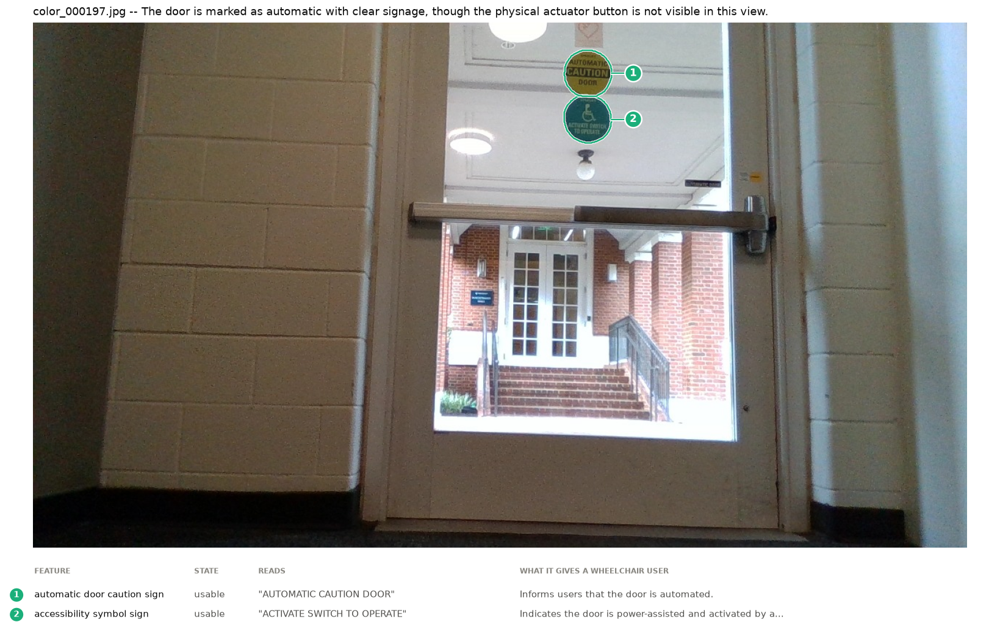

wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_features.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_features_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_features_labelmap.png


{'image': '/home/yuanhong/Desktop/unmapped_data/filtered/20260920_041230/color/color_000197.jpg',
 'width': 1280,
 'height': 720,
 'vlm_models': ['gemini-3.5-flash'],
 'sam_model': 'facebook/sam2.1-hiera-large',
 'note': 'The door is marked as automatic with clear signage, though the physical actuator button is not visible in this view.',
 'operator_hint': '',
 'annotations': [{'id': 1,
   'label': 'automatic door caution sign',
   'kind': 'automatic_door_sign',
   'tone': 'feature',
   'rating': 'usable',
   'relation': '',
   'text': 'AUTOMATIC CAUTION DOOR',
   'confidence': 'high',
   'note': 'Informs users that the door is automated.',
   'box_xyxy': [728.3, 38.2, 793.6, 100.1],
   'mask_pixels': 3295,
   'frame_fraction': 0.00358,
   'corridor_fraction': 0.0},
  {'id': 2,
   'label': 'accessibility symbol sign',
   'kind': 'accessibility_symbol',
   'tone': 'feature',
   'rating': 'usable',
   'relation': '',
   'text': 'ACTIVATE SWITCH TO OPERATE',
   'confidence': 'high',
   'n

In [14]:
fig = draw(door, features, feature_masks,
           columns=FEATURE_COLUMNS, rank=by_reading_order,
           title=f"{FEATURE_IMAGE.name} -- {found.entrance_note}",
           save_to=OUT_DIR / f"{FEATURE_IMAGE.stem}_features.png")
plt.show()

export(FEATURE_IMAGE, features, feature_masks, found.entrance_note, suffix="features")

## 7. Both passes, any frame

`annotate()` runs the whole chain twice over one image -- obstacles and features --
and draws them together, so a single picture says both what stands in the way and what
the place provides. Aqua is the only colour that means "this helps".

cached   color_000197_47a252944e49a1c3.json  (gemini-3-flash-preview)
cached   color_000197_95ad3573336cd651.json  (gemini-3.5-flash)


wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_annotated.png
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_annotated.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_annotated_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000197_annotated_labelmap.png


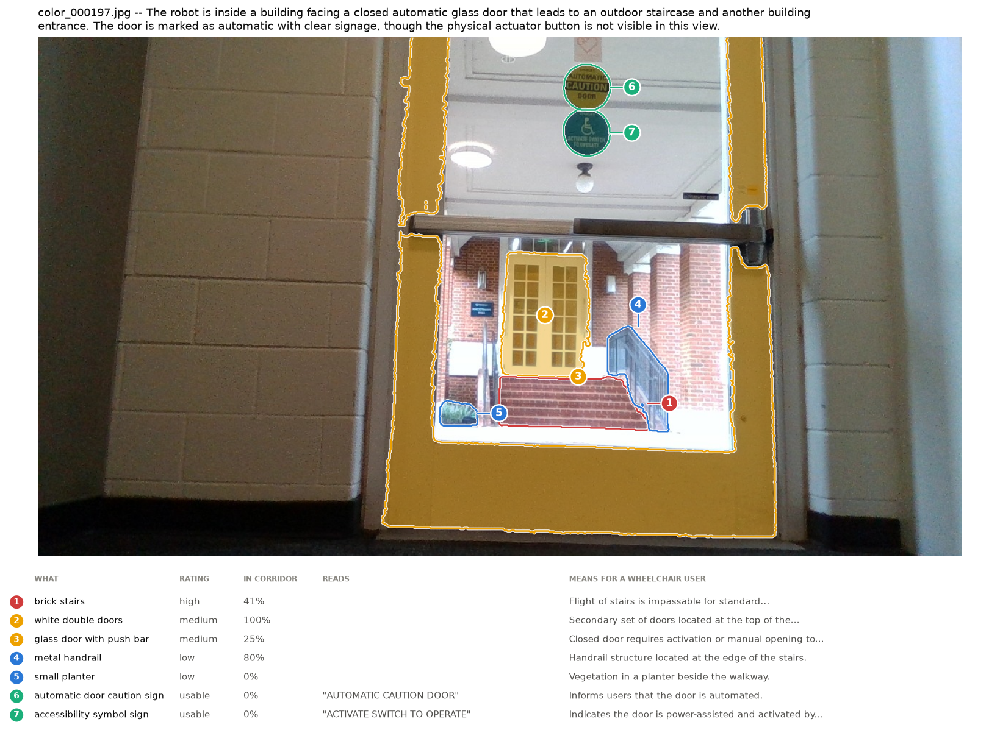

In [15]:
def annotate(image_path, passes=("barriers", "features"), hint="", show=True,
             min_conf=MIN_CONFIDENCE, refresh=False):
    """VLM -> SAM -> overlay + masks on disk, for one frame, either or both passes.

    `hint` is optional operator knowledge about what is in the frame -- see HINTED.
    """
    image_path = Path(image_path)
    img = Image.open(image_path).convert("RGB")
    anns, notes = [], []

    if "barriers" in passes:
        res = detect_barriers(image_path, hint=hint, refresh=refresh)
        got, _ = to_annotations(res.barriers, *img.size, barrier_annotation, min_conf)
        anns += got
        notes.append(res.scene_note)
    if "features" in passes:
        res = detect_features(image_path, hint=hint, refresh=refresh)
        got, _ = to_annotations(res.features, *img.size, feature_annotation, min_conf)
        anns += got
        notes.append(res.entrance_note)

    note = " ".join(notes)
    ms = segment(img, anns)
    fig = draw(img, anns, ms, columns=COMBINED_COLUMNS, rank=helps_last,
               title=f"{image_path.name} -- {note}",
               save_to=OUT_DIR / f"{image_path.stem}_annotated.png")
    data = export(image_path, anns, ms, note, suffix="annotated", hint=hint)
    plt.show() if show else plt.close(fig)
    return data


# The door frame judged on both counts at once: what it provides, and what is still
# in the way of reaching it.
both = annotate(FEATURE_IMAGE)

## 8. Harder frames: night, standing water and broken ground

The frames above are daylight, and they came out of `filtered/`, which means
`filter_frames.py` had already thrown the unusable ones away. `20260920_100352` is a
raw session that never went through that step, shot at night, and it is where this
chain is actually under load:

- **Standing water at night** stresses both models at once. The VLM has to tell a
  puddle from pavement that is merely wet, which it can only do from the mirrored
  lights on its surface. SAM then has to find an edge where the boundary is a change
  in reflectivity rather than a change in object -- there is no "thing" there, which
  is the one case box-prompted segmentation is weakest in.
- **Brick that has come out of a path** is two problems, not one: the loose pieces and
  the hole they left. The prompt asks for both, because a castor rolls on one and
  catches in the other.
- **The entrance in `color_000605`** is the feature pass on a door that has the
  hardware, not just the sign: a blue "ACTIVATE SWITCH TO OPERATE" decal on the glass
  *and* the silver actuator plate on the right jamb. A sign with no reachable button
  is a promise the building does not keep, so finding the two separately is the point.

These frames also introduce **operator hints**. The brick in `color_000254` is real
but almost invisible at this exposure, and the model does not find it unaided. Rather
than pretend otherwise, each frame carries a sentence from the person who recorded it
saying what is there; the model still has to locate it, and is told explicitly to stay
quiet if it cannot see what the sentence describes. The hint is part of the cache key
and is written into the exported json as `operator_hint`, so a frame annotated with
help is never mistaken for one the model read cold.


color_004060.jpg
cached   color_004060_b4205b2a1a154e3e.json  (gemini-3-flash-preview)


wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004060_annotated.png
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004060_annotated.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004060_annotated_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004060_annotated_labelmap.png


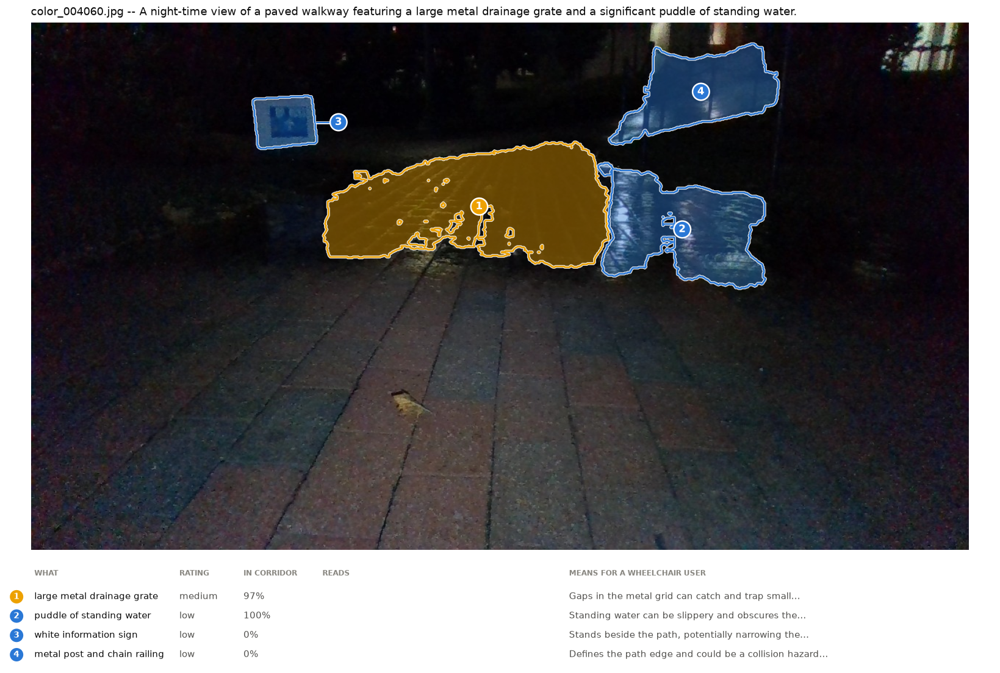


color_004860.jpg
cached   color_004860_5416ee11896bf381.json  (gemini-3-flash-preview)


wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004860_annotated.png
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004860_annotated.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004860_annotated_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_004860_annotated_labelmap.png


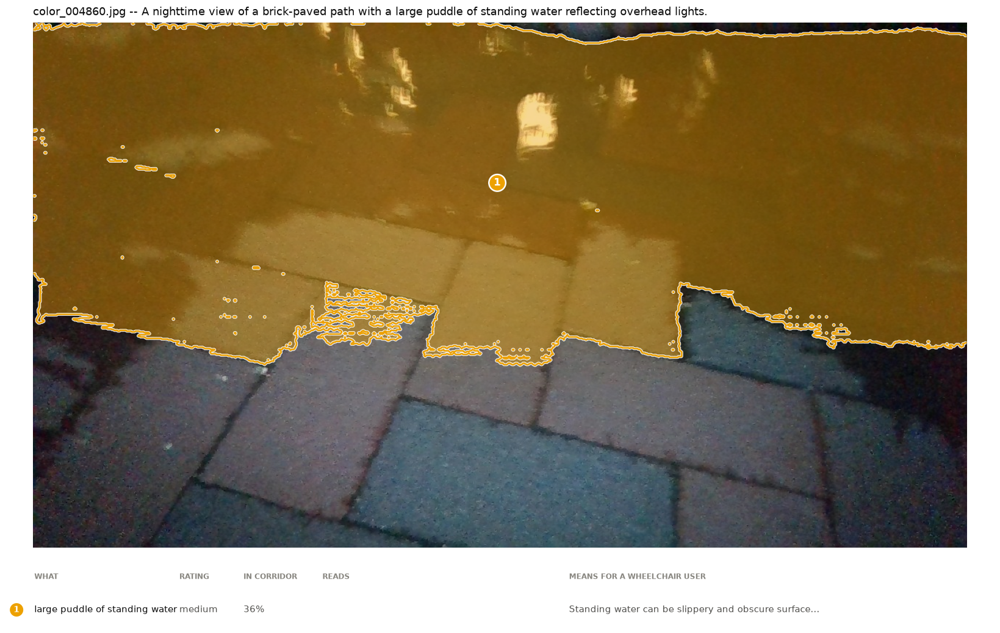


color_000254.jpg
cached   color_000254_fe2236459e553086.json  (gemini-3-flash-preview)


wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000254_annotated.png
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000254_annotated.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000254_annotated_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000254_annotated_labelmap.png


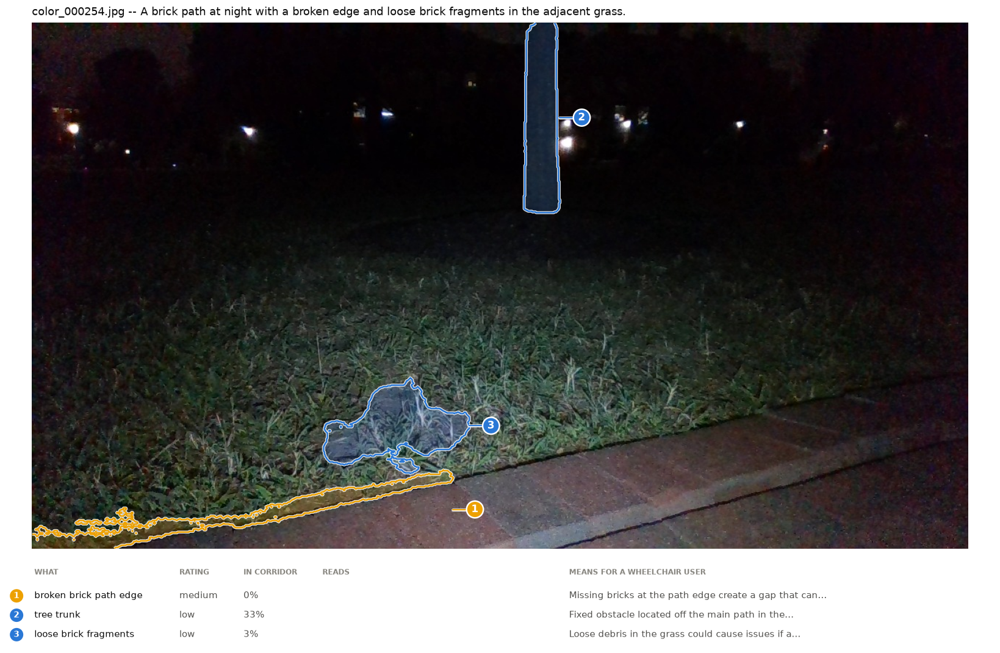


color_000605.jpg
cached   color_000605_44e730f3d28a9ac4.json  (gemini-3-flash-preview)


wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000605_annotated.png
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000605_annotated.json
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000605_annotated_masks.npz
wrote /home/yuanhong/Desktop/unmapped_data/segmentation_out/color_000605_annotated_labelmap.png


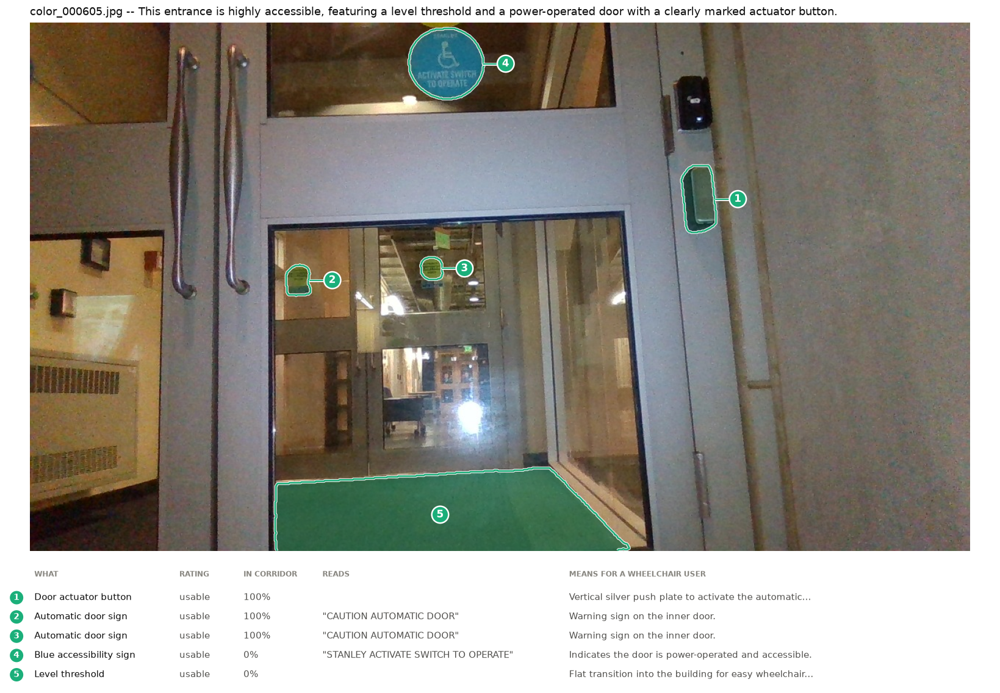

In [16]:
# Frames from a raw session directory, not from filtered/. Each is run through whichever
# pass suits it: the entrance wants the feature pass, the rest want obstacles.
NIGHT = PROJECT / "20260920_100352/color"

NIGHT_FRAMES = [
    (NIGHT / "color_004060.jpg", ("barriers",),
     "There is a large puddle of standing water lying on the paved walkway."),
    (NIGHT / "color_004860.jpg", ("barriers",),
     "There is a large puddle of standing water lying across the brick pavers."),
    (NIGHT / "color_000254.jpg", ("barriers",),
     "Paving brick has broken out of the edge of the path, and the loose pieces are "
     "lying in the grass just beside it."),
    (NIGHT / "color_000605.jpg", ("features",),
     "The door carries a blue accessible-entrance sign, and there is a silver "
     "rectangular actuator button on the wall to the right of the door."),
]

for path, passes, hint in NIGHT_FRAMES:
    print(f"\n{'=' * 78}\n{path.name}\n{'=' * 78}")
    annotate(path, passes=passes, hint=hint)

In [17]:
# A few more frames from the same run. Uncomment to go wider.
# frames = sorted((PROJECT / "filtered/20260920_053537/color").glob("*.jpg"))[::60]
# for f in frames:
#     annotate(f, passes=("barriers",))